In [1]:
%load_ext autoreload
%autoreload 2

# Link Analysis
Conducting a link analysis of a network graph involves identifying and analyzing the link within the graph. 

In [2]:
import pandas as pd
import numpy as np
from os.path import join
import os


from dotenv import load_dotenv
load_dotenv()  

path = os.environ['DATA_DIRECTORY']
df_snapshots = pd.read_csv('../data/snapshot_selection.csv')
df_tokens = pd.read_csv("../data/final_token_selection.csv")


In [3]:
import sys
sys.path.append('..') 

from src.analysis.link_analysis import * 
from src.visualisations.link_analysis_visualisations import * 

## Create dataframes for each metrics

In [4]:
# Specify the path to the file containing the saved cliques data
links_data_path = join(path, '../output/links/metrics/links_data_v2.pkl') # load reference value

links_data = LinkData(links_data_path)


# Use the metric_names attribute from CliquesData
metric_names = links_data.metric_names


# Initialize an empty dictionary to store DataFrames for each metric
metric_dataframes = {'sample': {},'sample_population': {},'pvalues': {}, 'sample_directional':{}, 'sample_population_directional':{}, 'pvalues_directional':{}}

# Create DataFrames for each metric
for group in ['sample', 'sample_population', 'pvalues', 'sample_directional', 'sample_population_directional', 'pvalues_directional']:
    for metric_name in metric_names:
        metric_dataframes[group][metric_name] = links_data.get_metric_data(group, metric_name)
        

## Figure Generation

### Fig: Size of Clique 

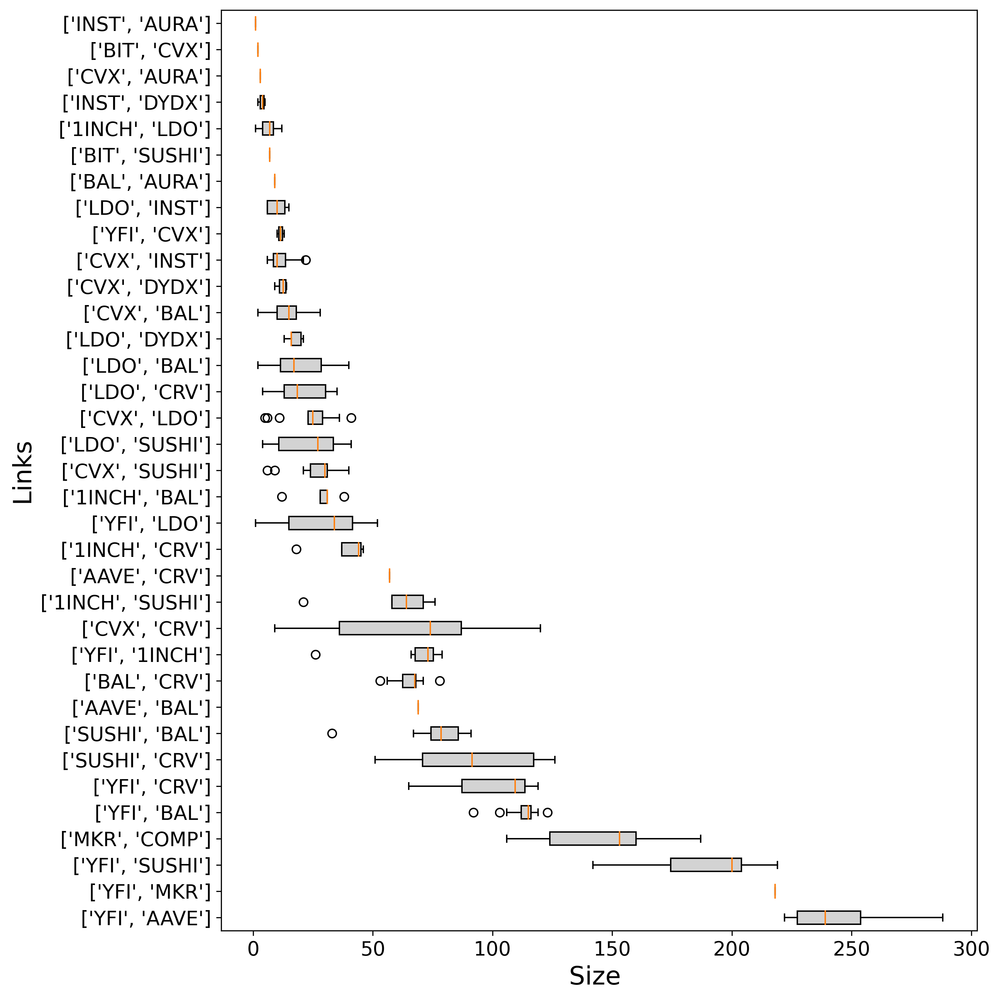

In [5]:
plot_boxplot(metric_dataframes, metric='size', unit='', group='sample', output_path="../output/links/", min_occurrences=1, save=False, show=True)


### Fig: link growth over time 

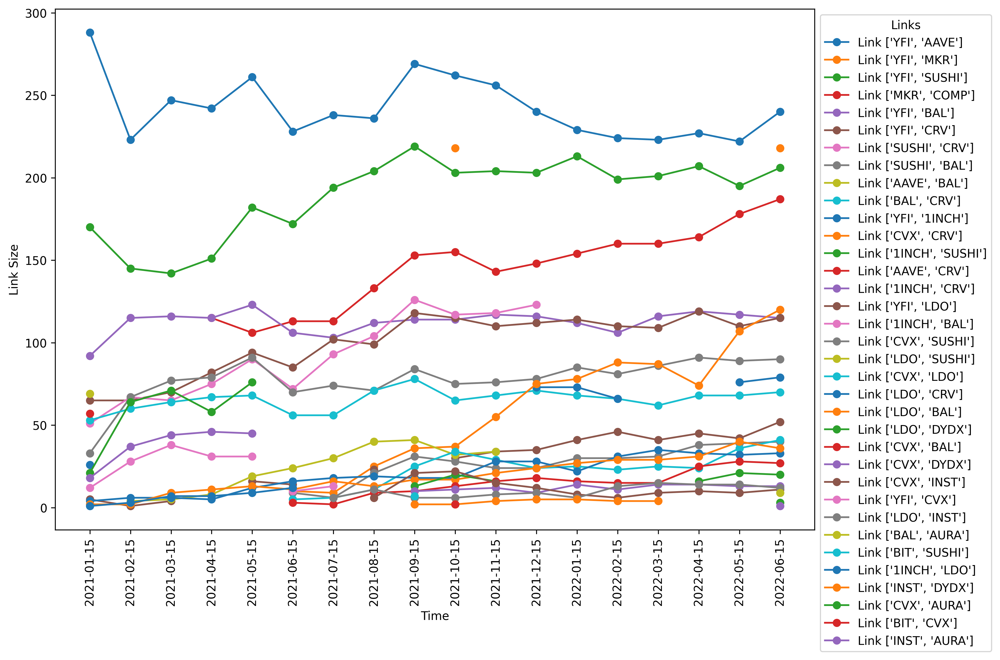

In [6]:
plot_link_growth_over_time(metric_dataframes, group='sample', output_path="../output/links/", save=False, show=True)

### Fig: Scatter  

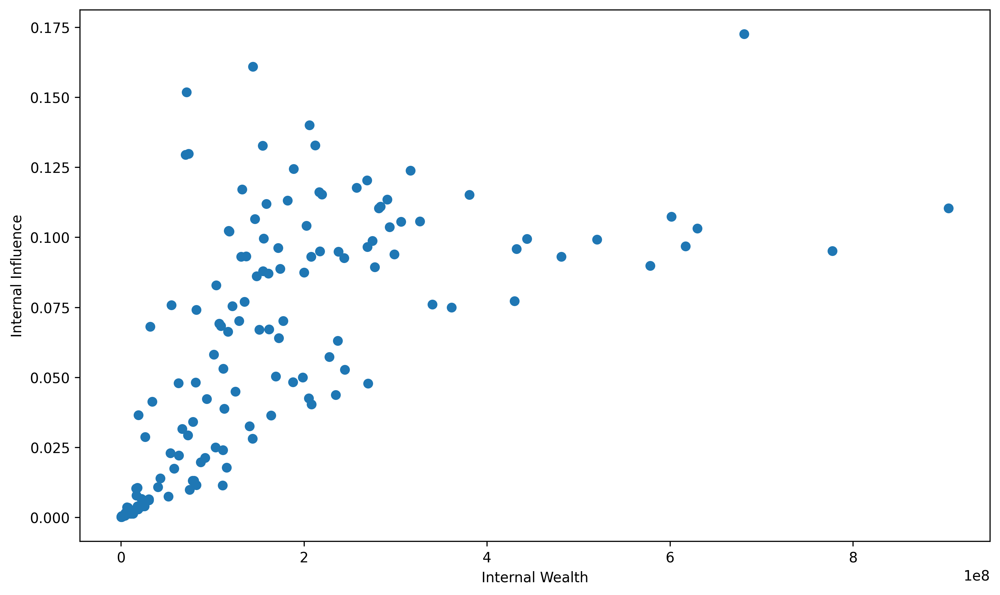

In [7]:
plot_scatter_metrics(metric_dataframes, 'internal_wealth', 'internal_influence', save=False)


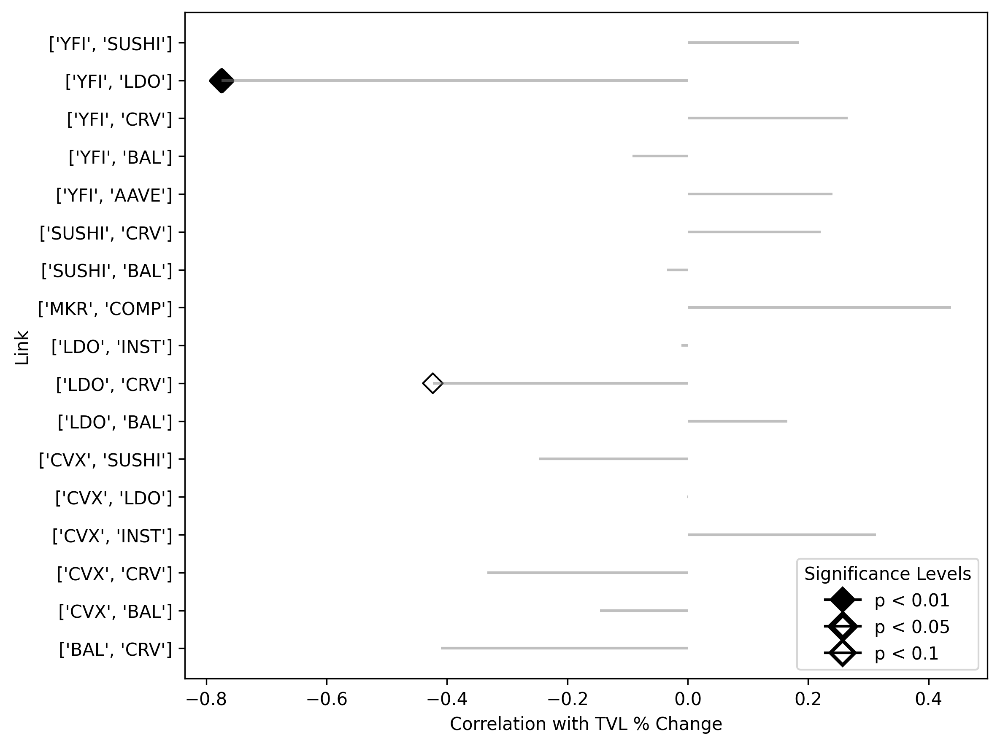

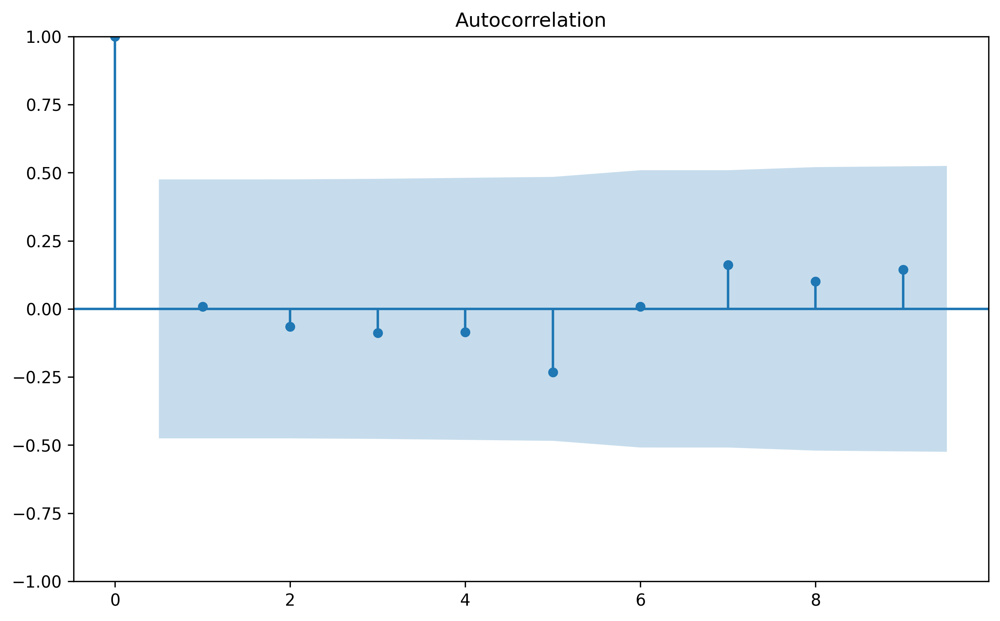


===== Summary Statistics =====
                  Correlation   P-value  Durbin-Watson  Ljung-Box P-value
Link Name                                                                
['BAL', 'CRV']      -0.409829  0.102310       0.637532           0.070298
['CVX', 'BAL']      -0.145705  0.651386       2.098602           0.789454
['CVX', 'CRV']      -0.333016  0.290180       1.254367           0.497781
['CVX', 'INST']      0.312456  0.379414       2.481802           0.313440
['CVX', 'LDO']      -0.000969  0.997614       2.287230           0.670123
['CVX', 'SUSHI']    -0.246377  0.440150       1.528217           0.334456
['LDO', 'BAL']       0.165280  0.526119       2.830881           0.263514
['LDO', 'CRV']      -0.423490  0.090286       1.796345           0.754457
['LDO', 'INST']     -0.010710  0.975068       2.063680           0.973852
['MKR', 'COMP']      0.437134  0.118059       2.147889           0.897564
['SUSHI', 'BAL']    -0.034043  0.896799       1.581250           0.871297
['SUSH

,Correlation,P-value,Durbin-Watson,Ljung-Box P-value
Link Name,,,,
"['BAL', 'CRV']",-0.409829,0.102310,0.637532,0.070298
"['CVX', 'BAL']",-0.145705,0.651386,2.098602,0.789454
"['CVX', 'CRV']",-0.333016,0.290180,1.254367,0.497781
"['CVX', 'INST']",0.312456,0.379414,2.481802,0.313440
"['CVX', 'LDO']",-0.000969,0.997614,2.287230,0.670123
"['CVX', 'SUSHI']",-0.246377,0.440150,1.528217,0.334456
"['LDO', 'BAL']",0.165280,0.526119,2.830881,0.263514
"['LDO', 'CRV']",-0.423490,0.090286,1.796345,0.754457
"['LDO', 'INST']",-0.010710,0.975068,2.063680,0.973852


In [8]:
plot_lollipop_correlation_vs_tvl_adjusted_auto_corr(metric_dataframes, metric='internal_influence', min_occurrences=9, output_path='../output/links', tvl_data_path='../data/tvl.json', save=True, show=True)

### Fig: TVL

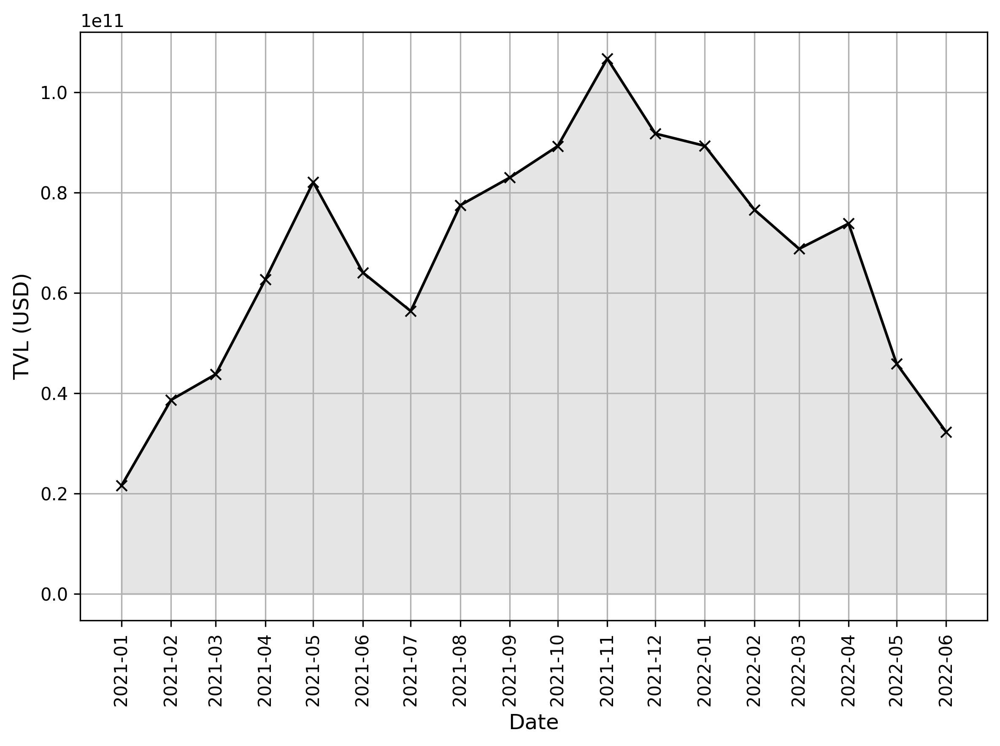

In [ ]:
plot_monthly_tvl(metric_dataframes, tvl_data_path='../data/tvl.json', save=True, show=True)


### Fig: Internal Influence

/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


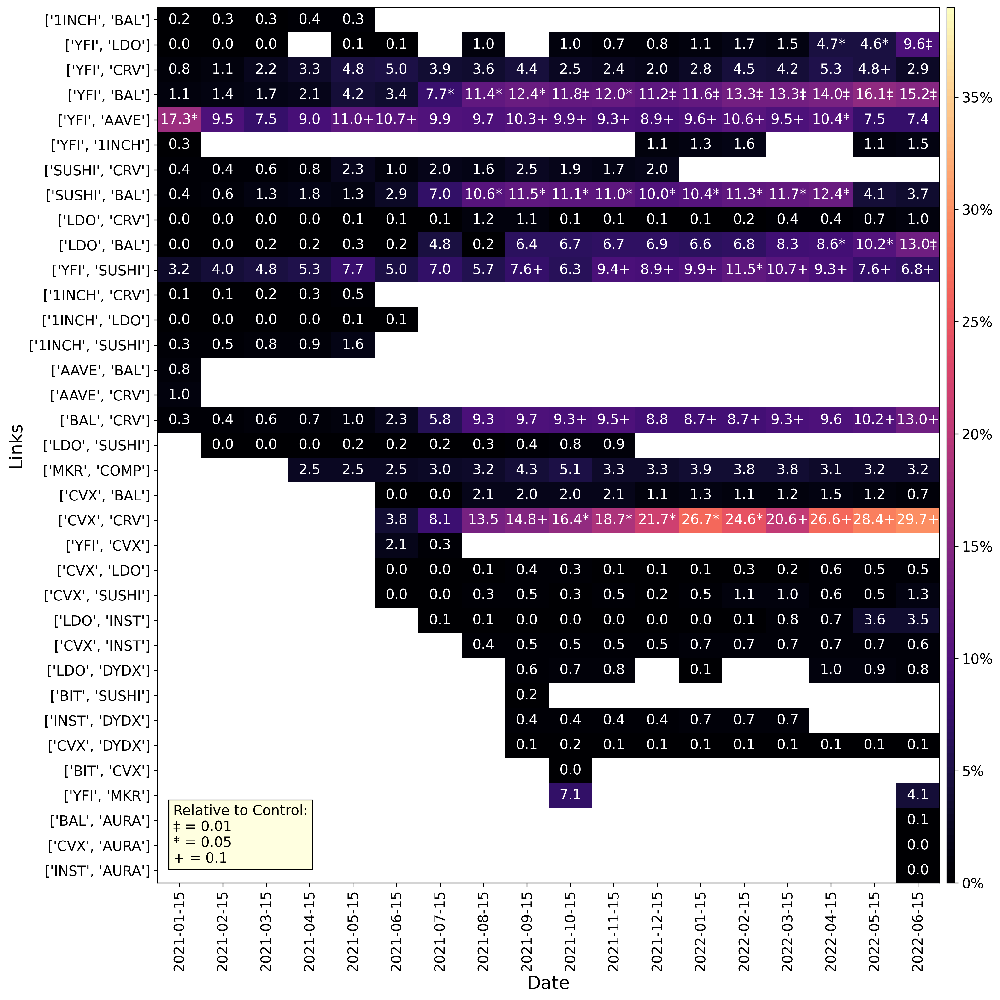

In [10]:
plot_heatmap_chart(metric_dataframes, metric_name='internal_influence', pct=True,  log=False, output_path="../output/links/", save=True, show=True)

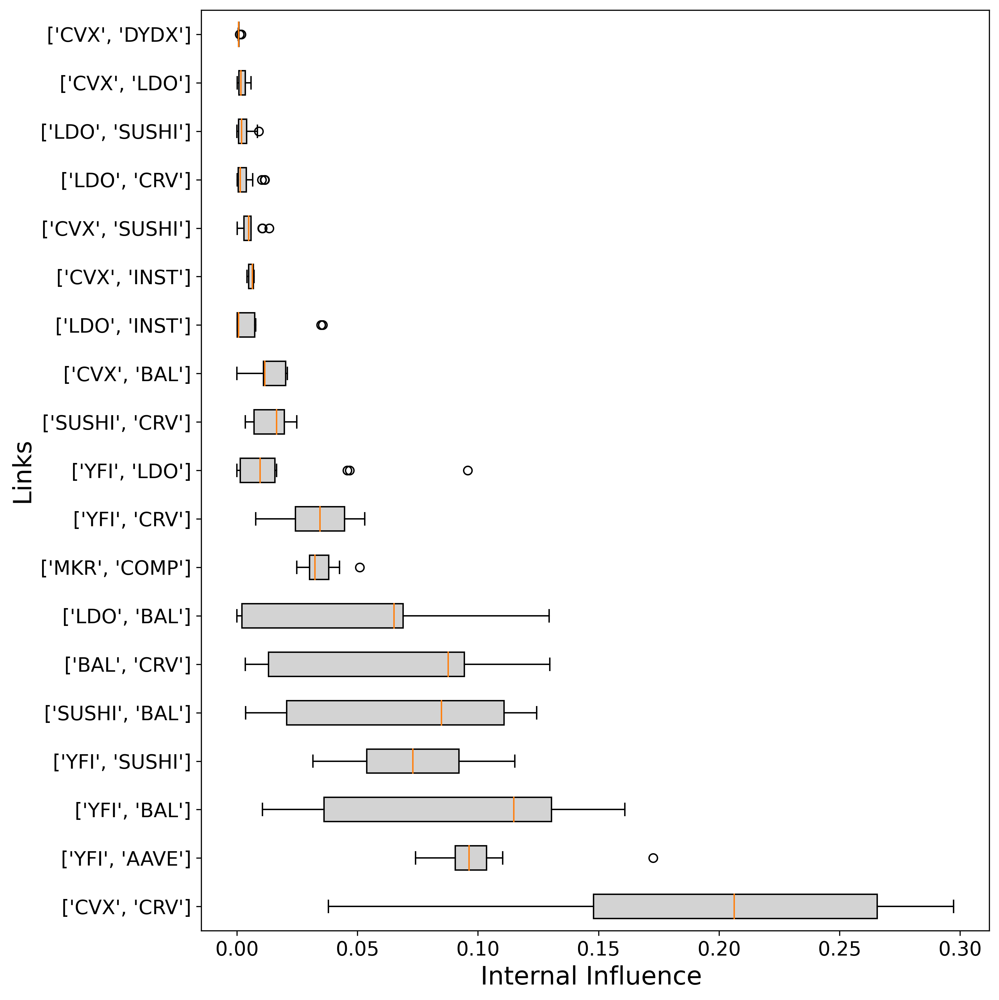

In [11]:
plot_boxplot(metric_dataframes, metric='internal_influence', unit='',group='sample', output_path="../output/links/", min_occurrences=9, save=True, show=True)

### Fig: Gini Internal Influence

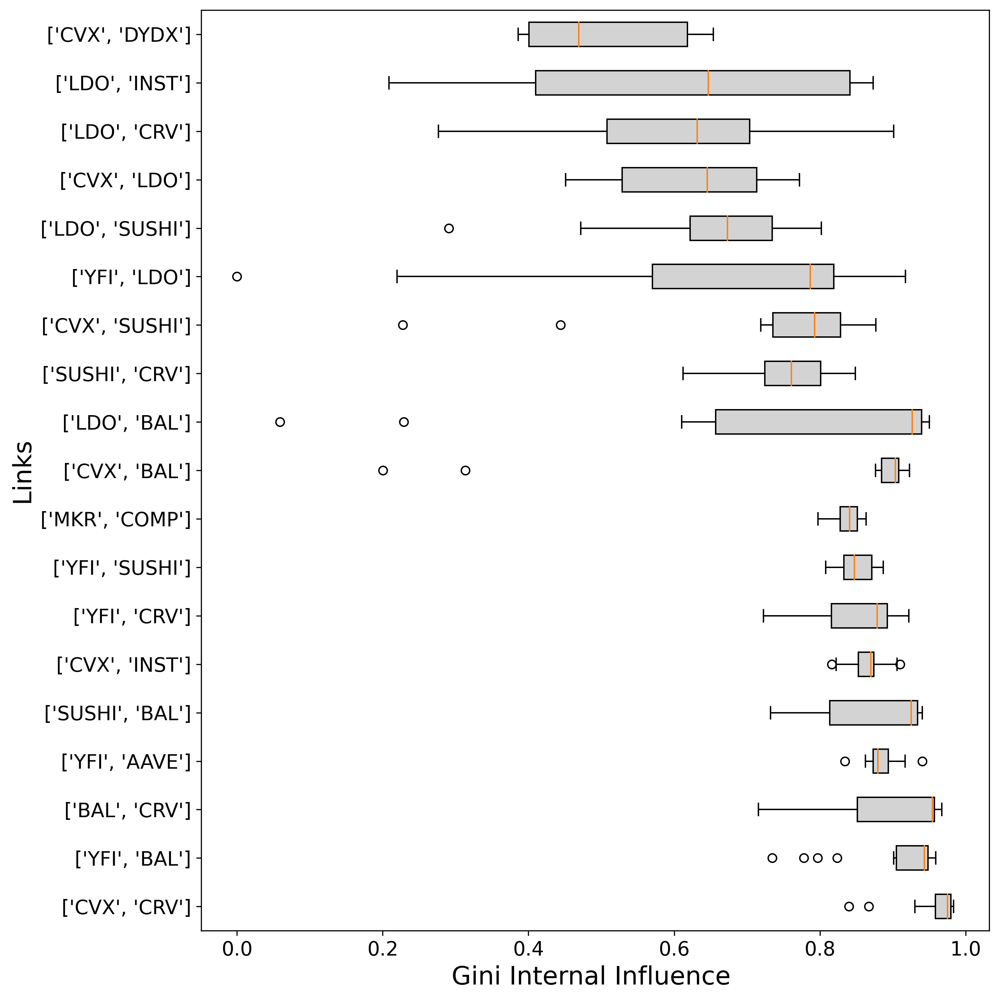

In [12]:
plot_boxplot(metric_dataframes, metric='gini_internal_influence', unit='', group='sample', pval_group='pvalues', output_path="../output/links/", custom_index='', min_occurrences=9, significance=False, save=True, show=True)

### Fig: external_influence

/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


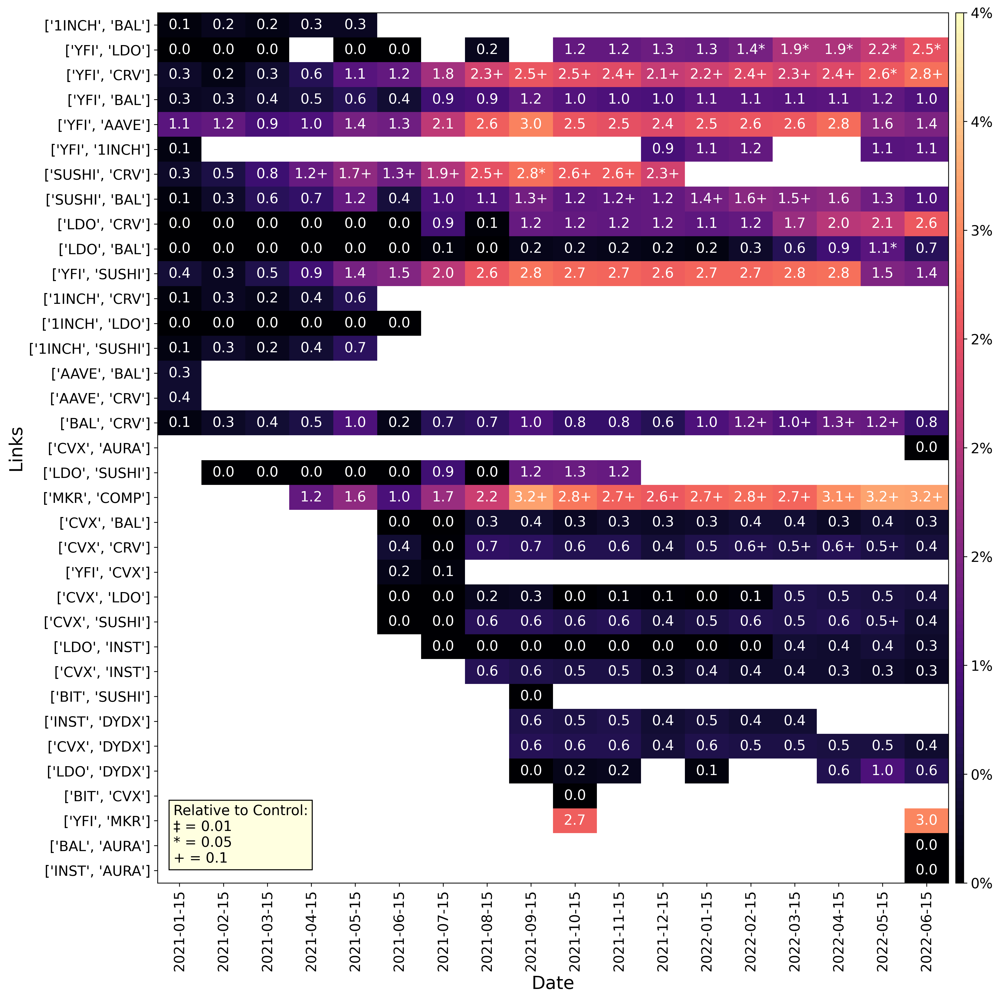

In [13]:
plot_heatmap_chart(metric_dataframes, metric_name='external_influence', pct=True, log=False, output_path="../output/links/", save=True, show=True)

### Fig: gini_external_influence

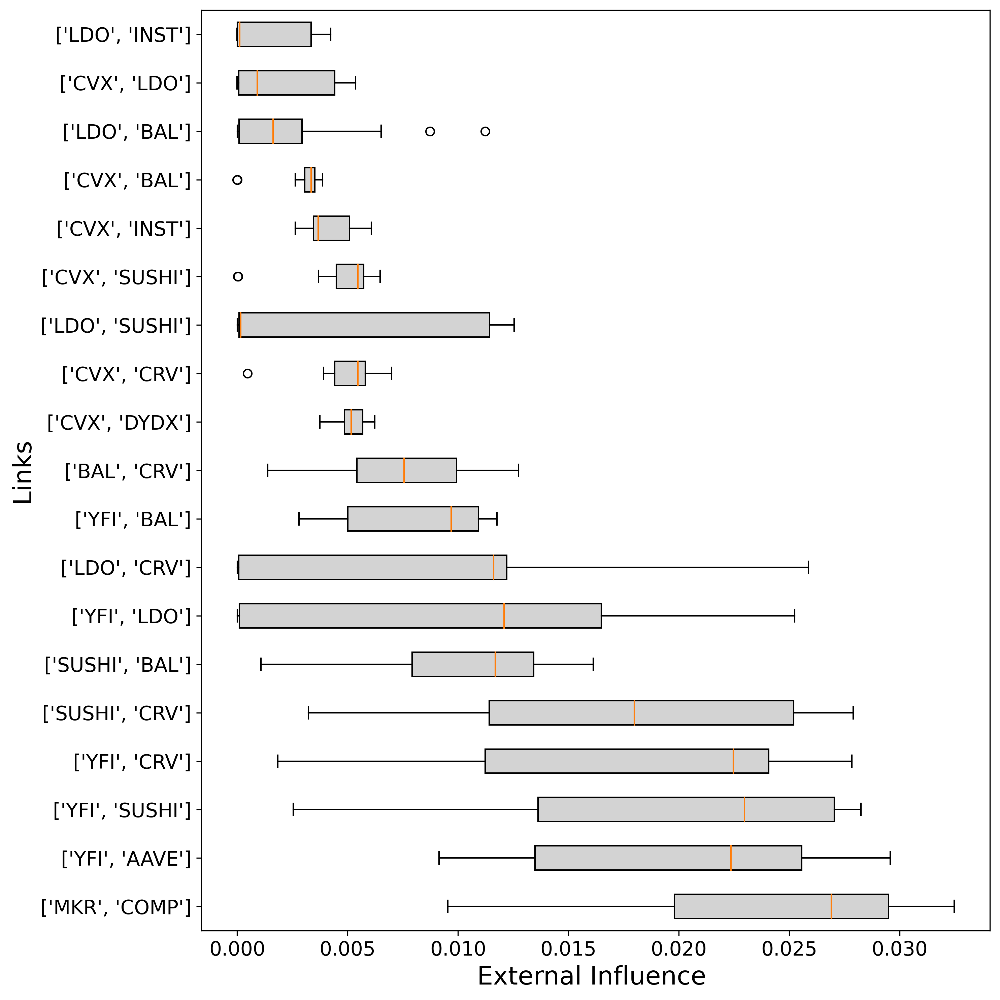

In [14]:
plot_boxplot(metric_dataframes, metric='external_influence', unit='', group='sample', output_path="../output/links/", save=True, show=True)

### Fig: Wealth 


/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


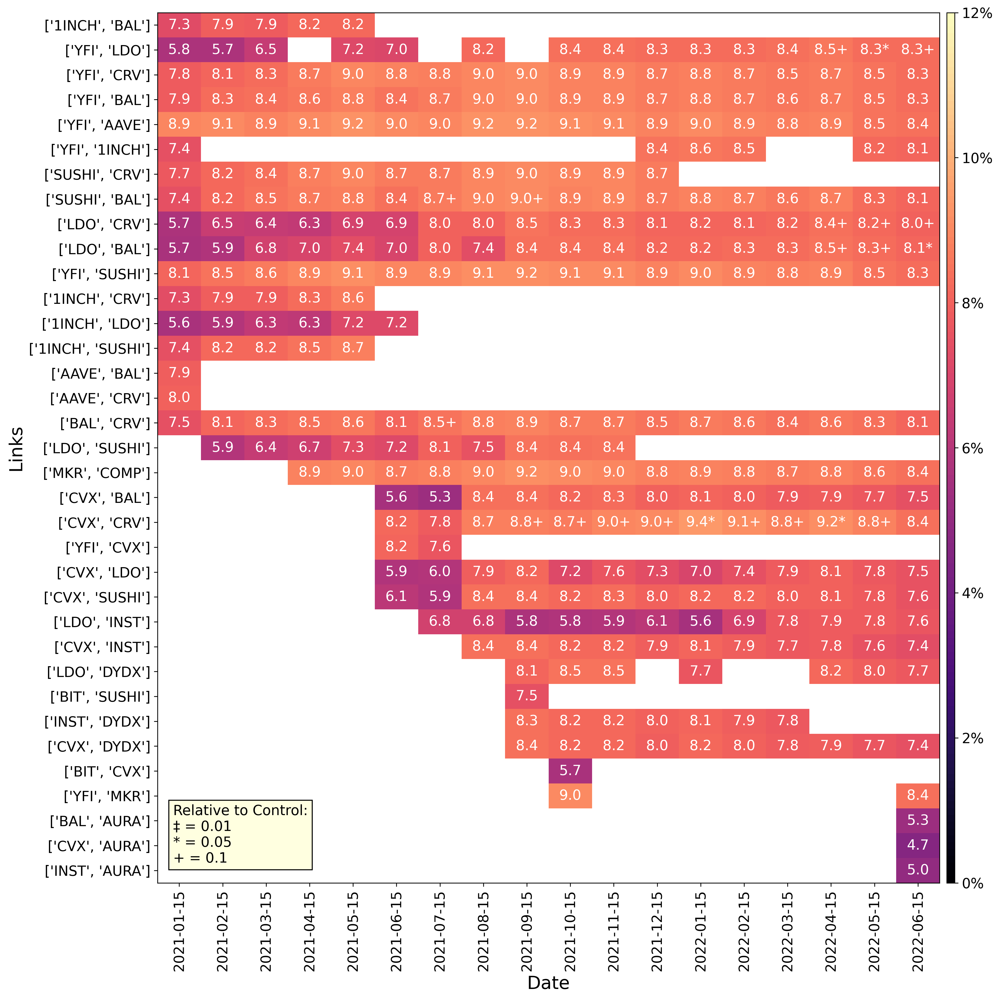

In [15]:
plot_heatmap_chart(metric_dataframes, metric_name='total_wealth', pct=False, log=True, output_path="../output/links/", save=True, show=True)

### Fig: gini_wealth_clique

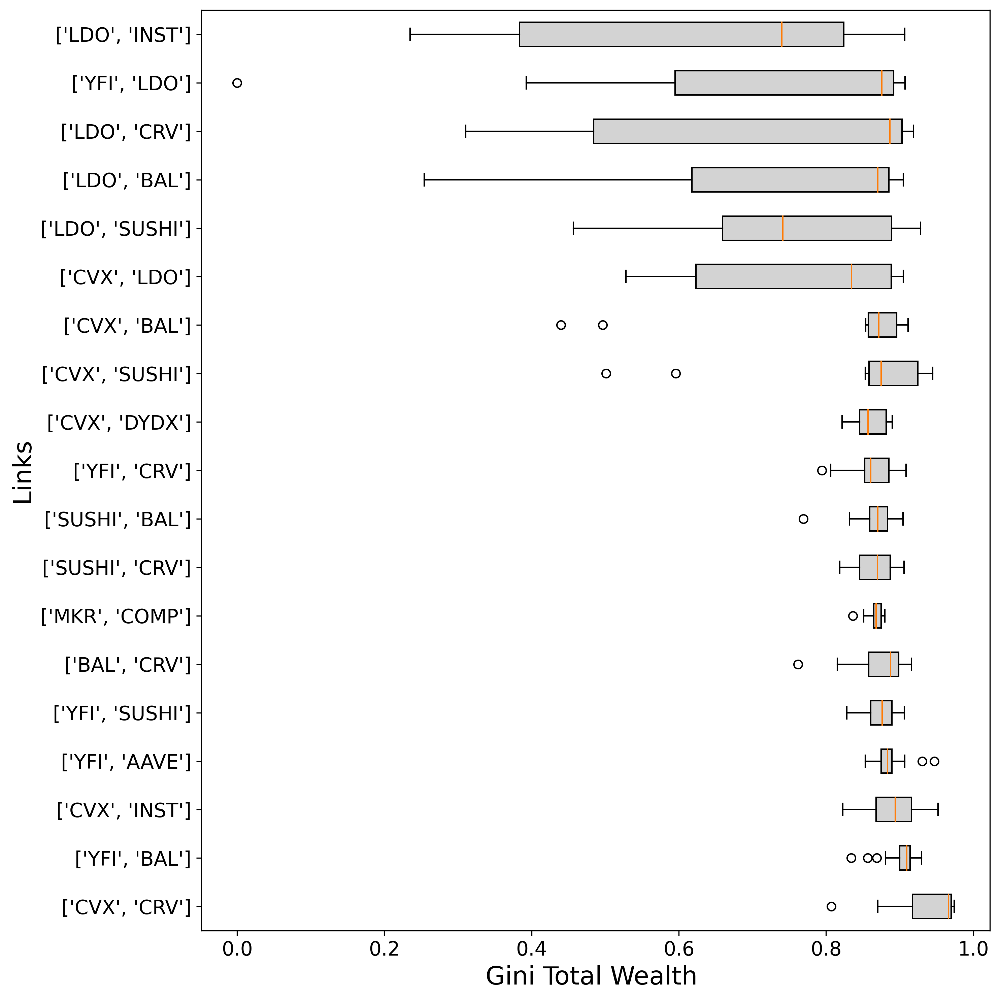

In [16]:

plot_boxplot(metric_dataframes, metric='gini_total_wealth', unit='', group='sample', output_path="../output/links/", save=True, show=True)


### Fig: median_wealth_level

/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


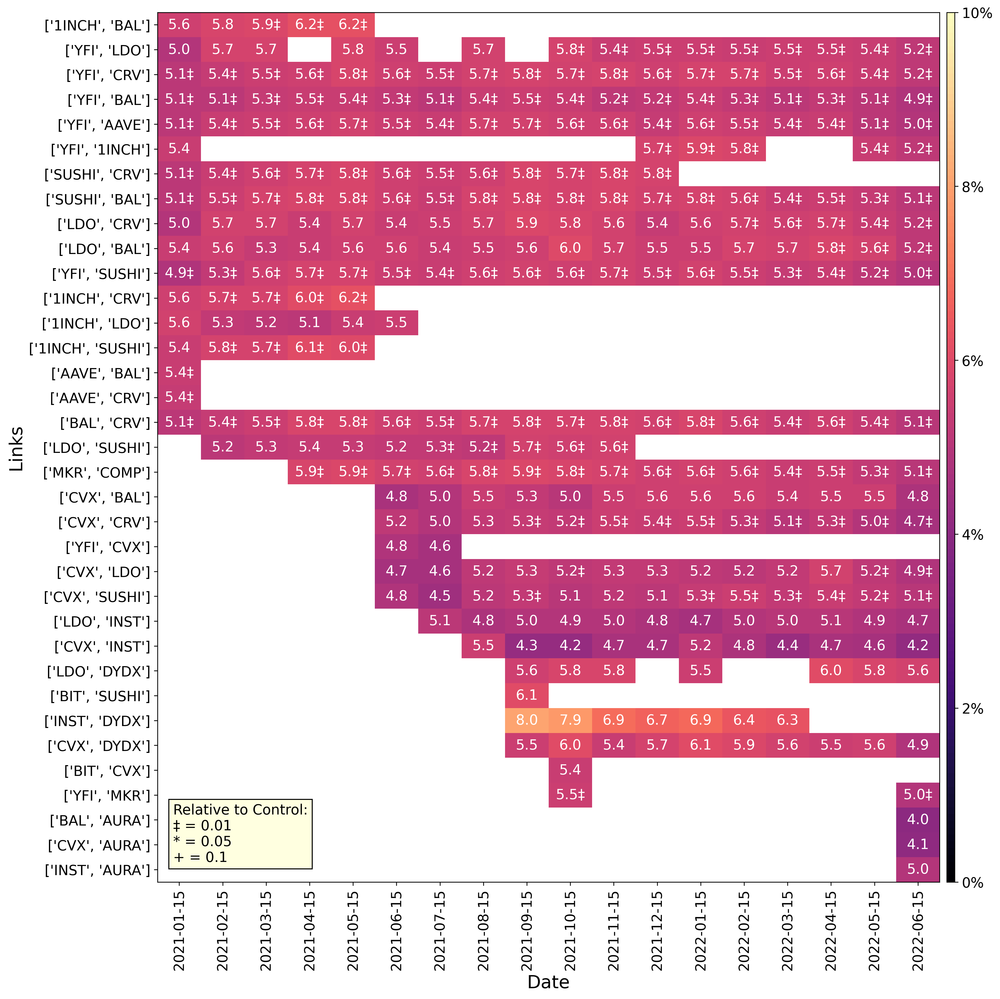

In [17]:
plot_heatmap_chart(metric_dataframes, metric_name='median_wealth', pct=False, log=True, output_path="../output/links/", save=True, show=True)

In [ ]:
plot_boxplot(metric_dataframes, metric='median_wealth', unit='', group='sample', output_path="../output/links/", min_occurrences=2, save=False, show=True)


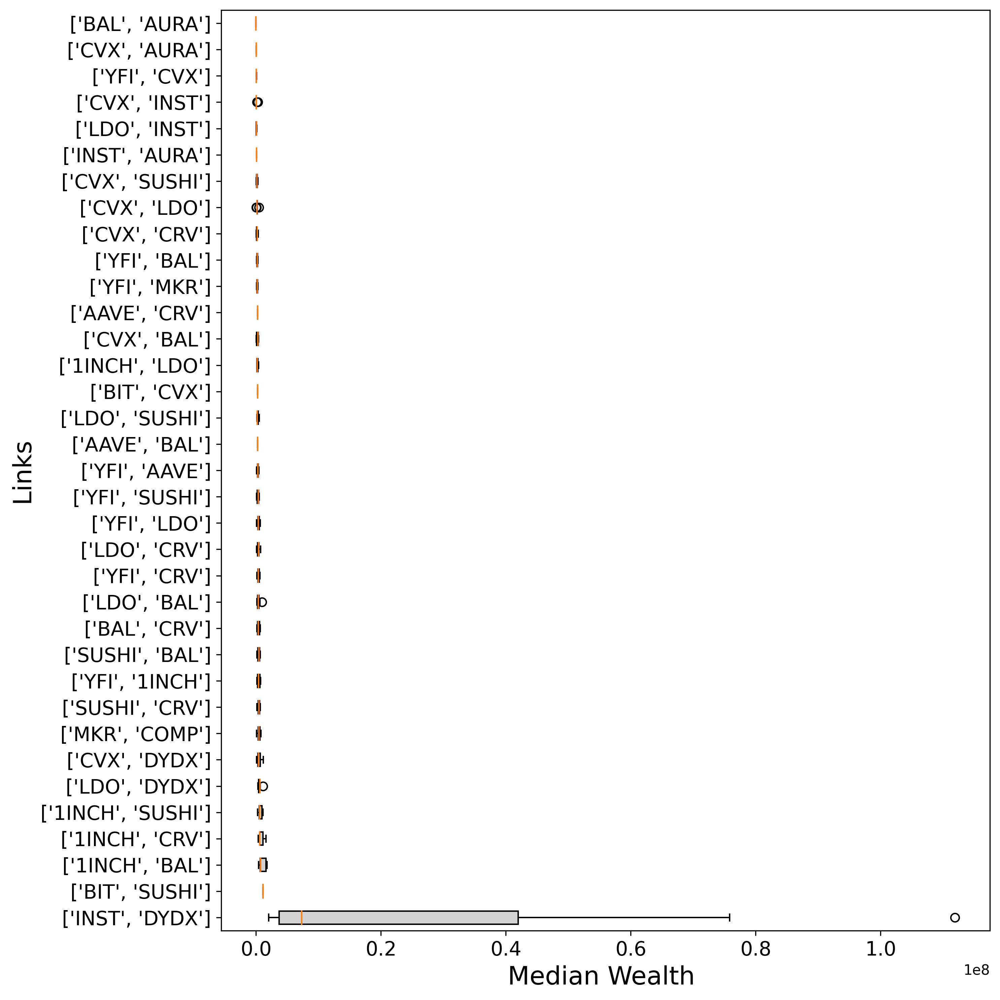

In [19]:
plot_boxplot(metric_dataframes, metric='median_wealth', unit='', group='sample', output_path="../output/links/", min_occurrences=1, save=False, show=True)


### Fig: internal_wealth

/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


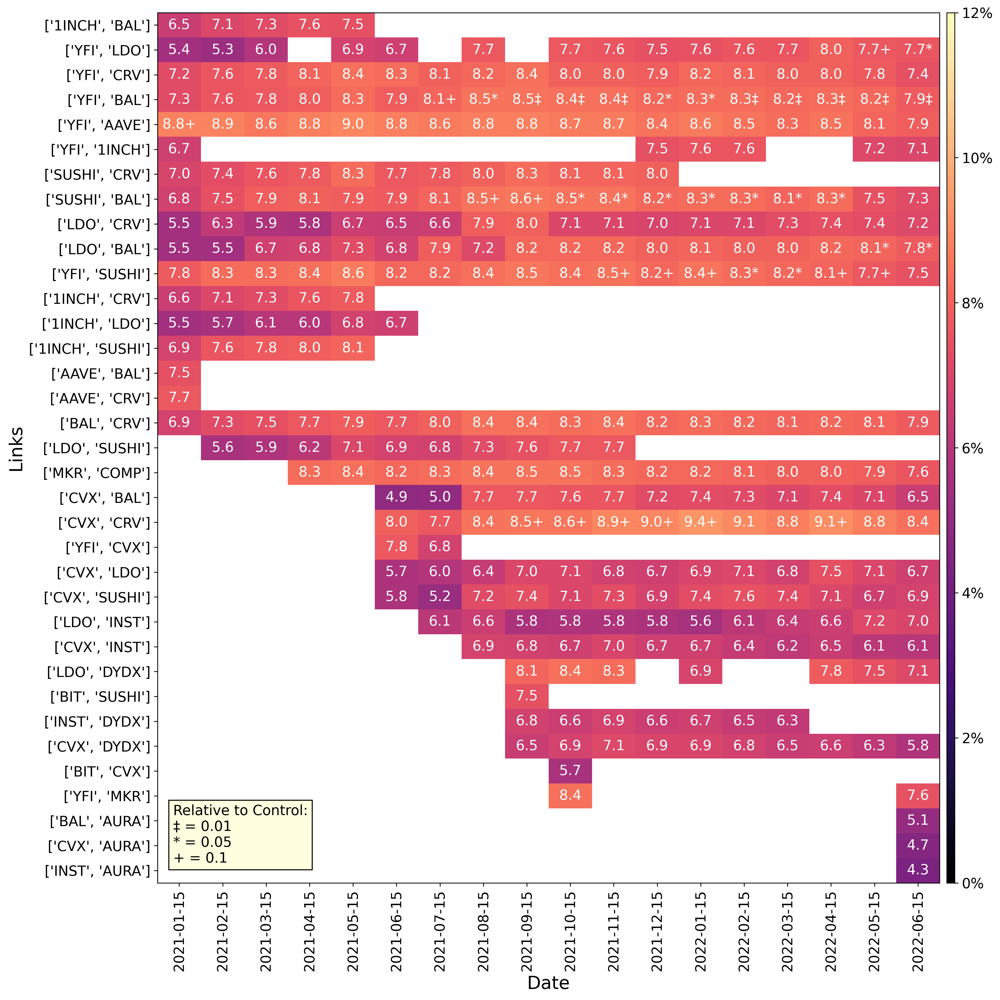

In [20]:
plot_heatmap_chart(metric_dataframes, metric_name='internal_wealth', pct=False, log=True, output_path="../output/links/", save=False, show=True)

/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


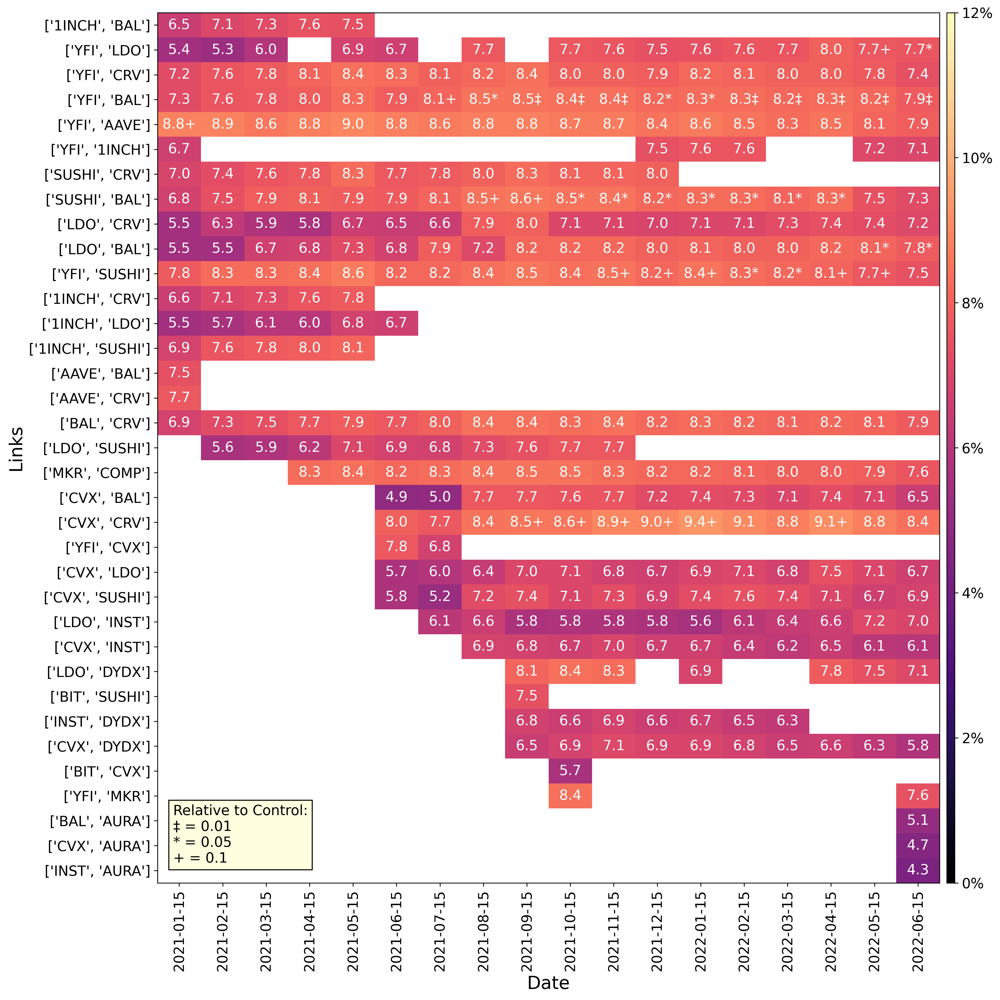

In [21]:
plot_heatmap_chart(metric_dataframes, metric_name='internal_wealth', pct=False, log=True, output_path="../output/links/", save=True, show=True)

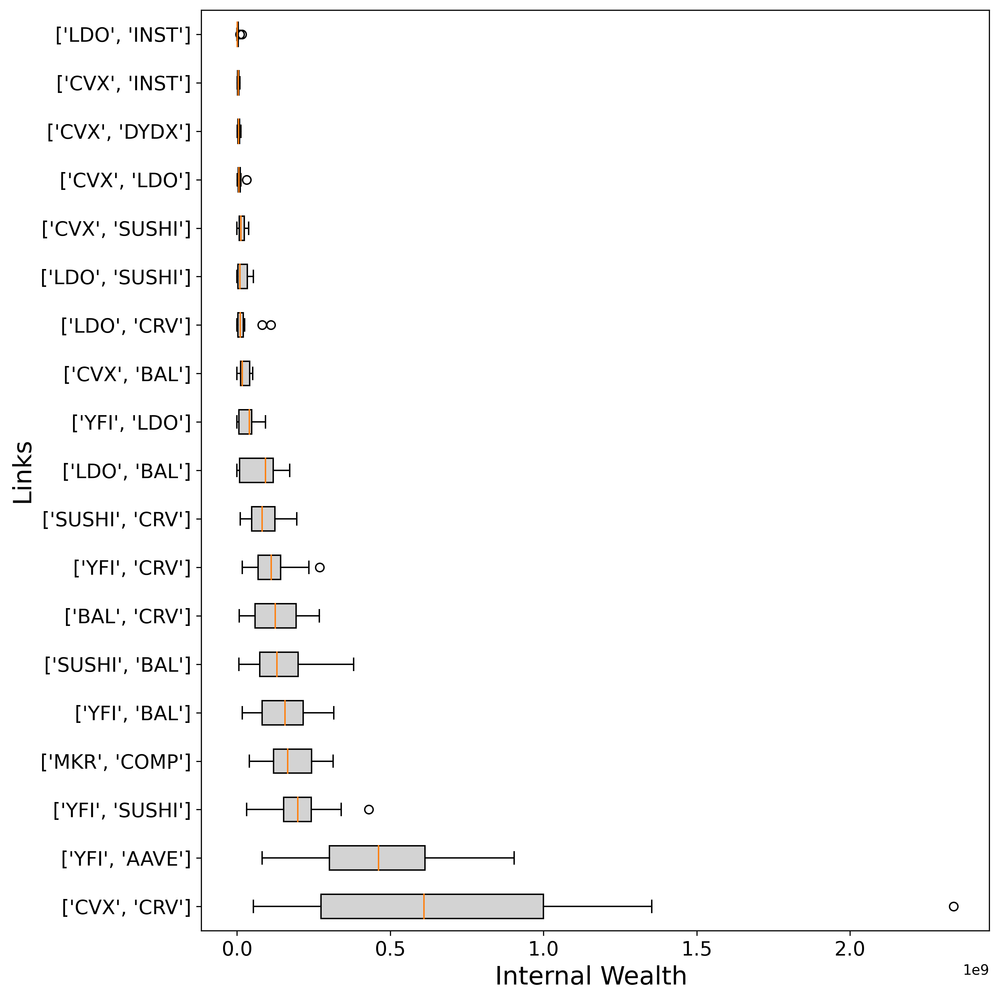

In [22]:

plot_boxplot(metric_dataframes, metric='internal_wealth', unit='', group='sample', output_path="../output/links/", save=True, show=True)


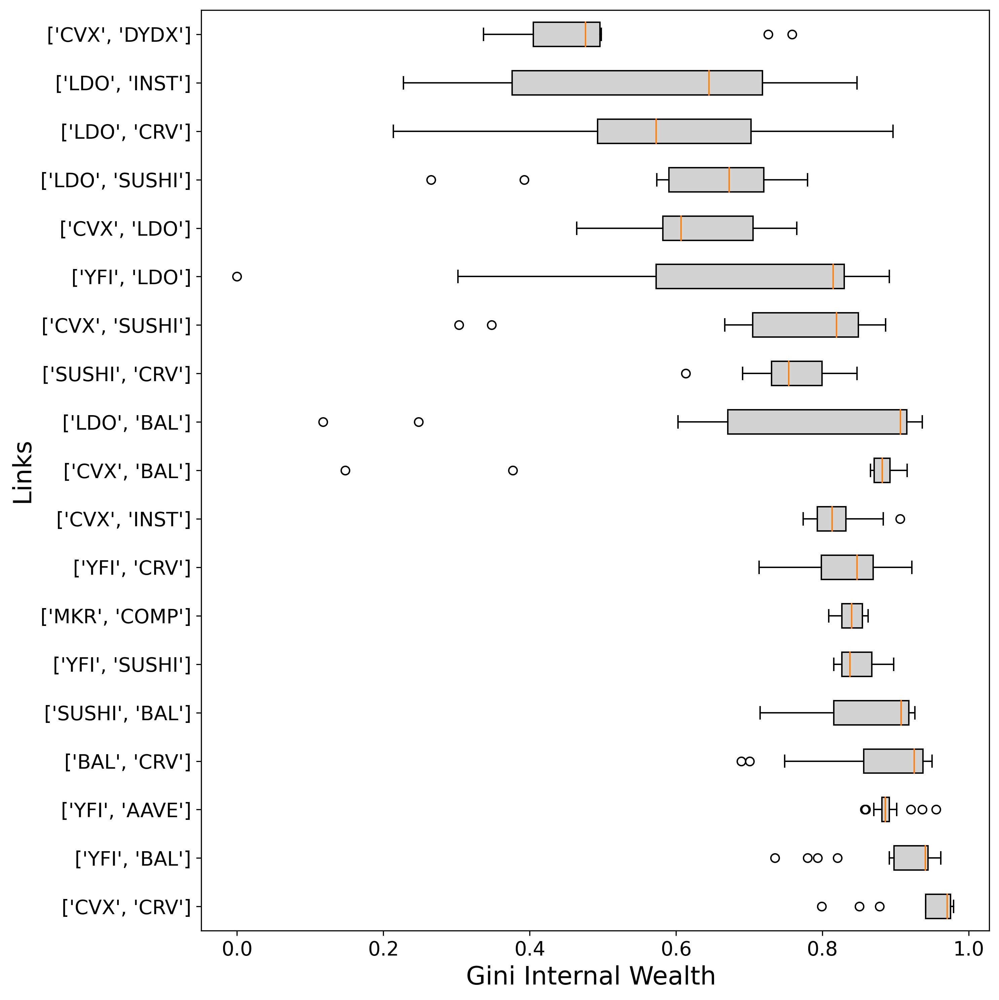

In [24]:
plot_boxplot(metric_dataframes, metric='gini_internal_wealth', unit='', group='sample', output_path="../output/links/", save=True, show=True)


### Fig: external_wealth

/home/xm3van/research-project-erc20-governance/.venv/lib/python3.8/site-packages/pandas/core/internals/blocks.py:329: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)
/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


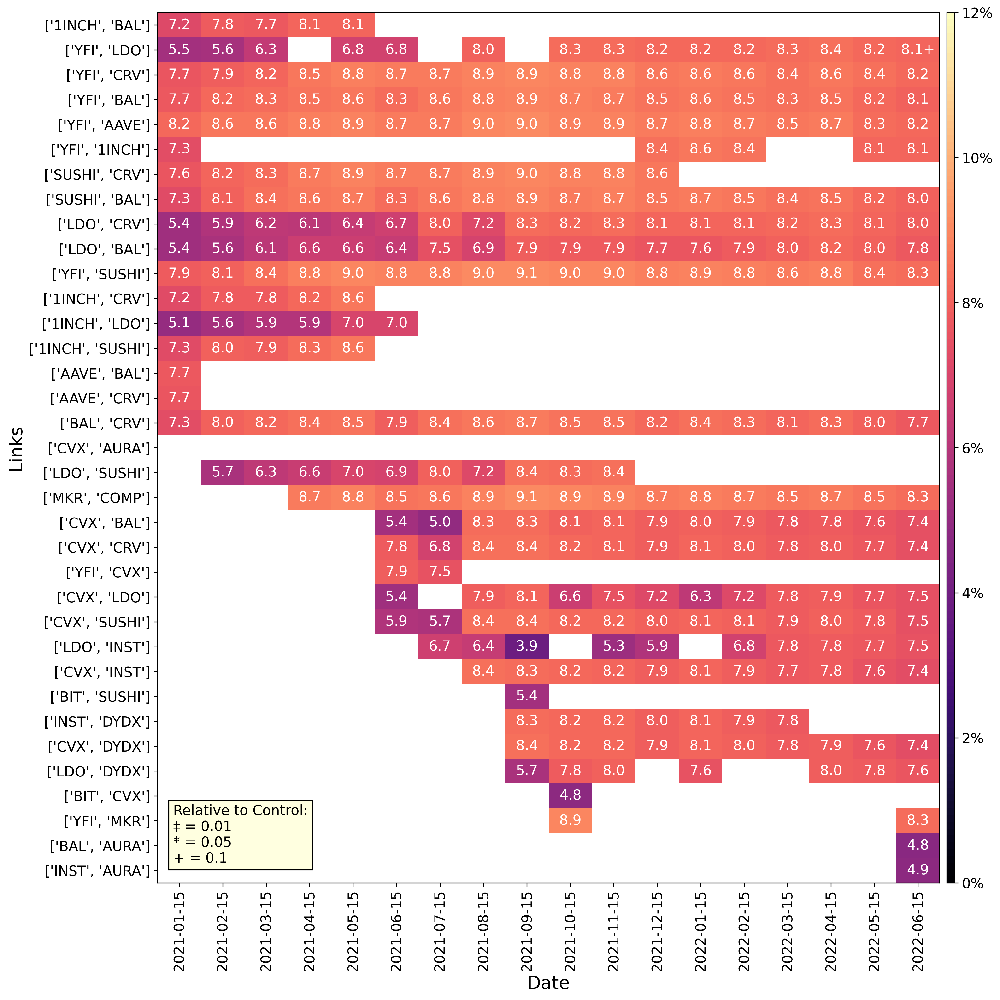

In [25]:
plot_heatmap_chart(metric_dataframes, metric_name='external_wealth', pct=False, log=True, output_path="../output/links/", save=True, show=True)

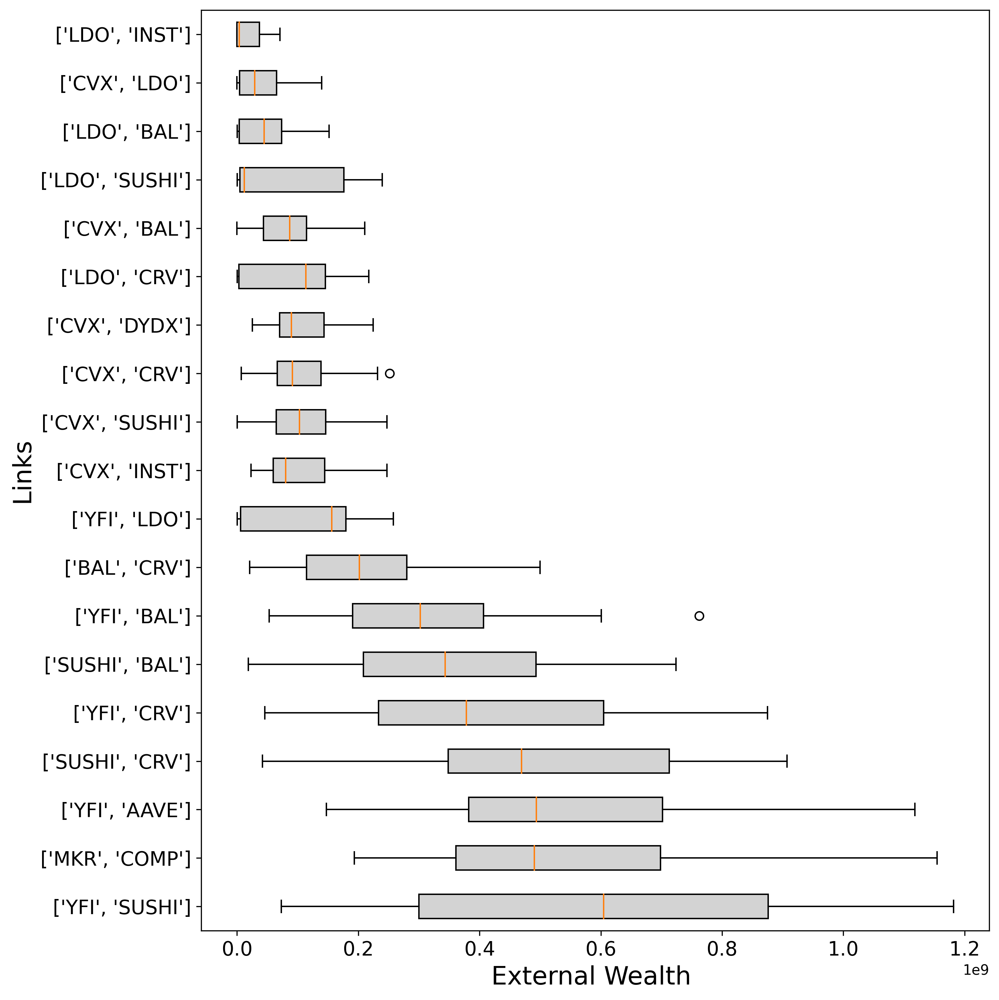

In [26]:
plot_boxplot(metric_dataframes, metric='external_wealth', unit='', group='sample', output_path="../output/links/", save=False, show=True)


### Fig: gini_external_wealth

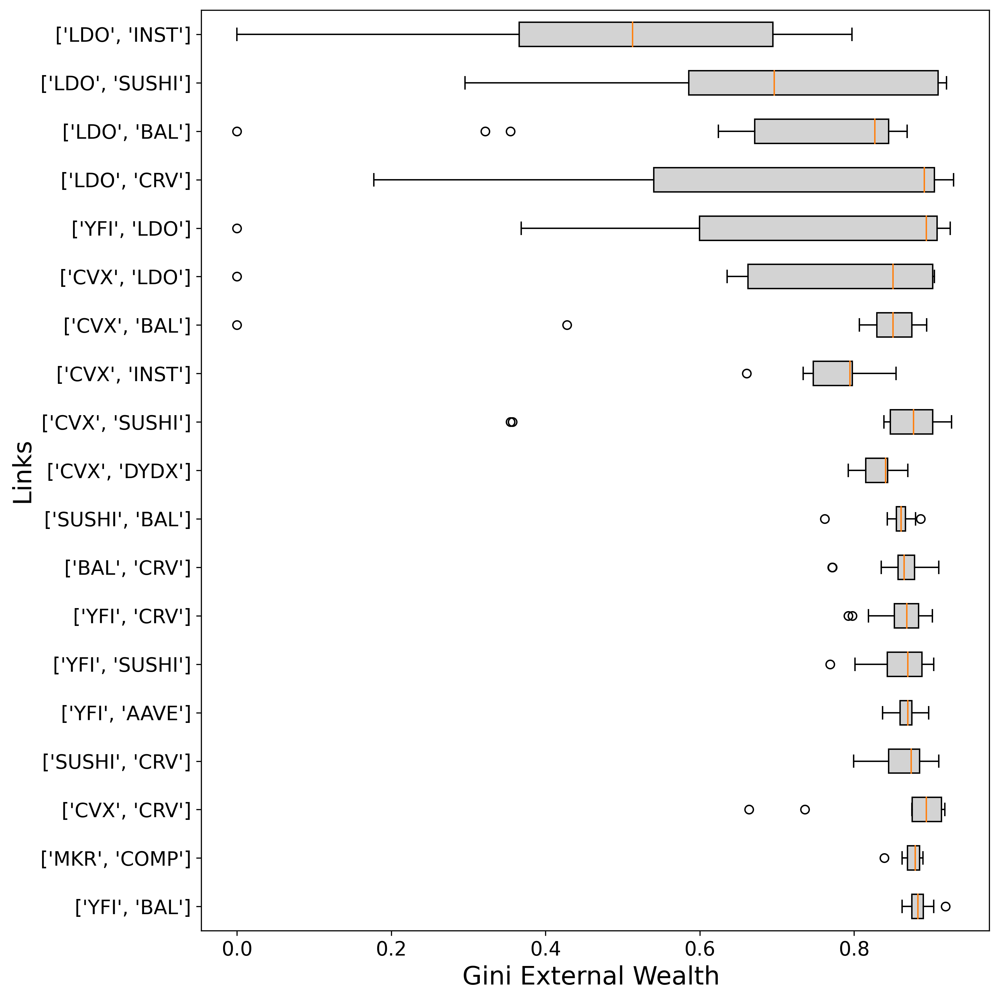

In [27]:
plot_boxplot(metric_dataframes, metric='gini_external_wealth', unit='', group='sample', output_path="../output/links/", save=True, show=True)


### Fig: median_no_assets_link


/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


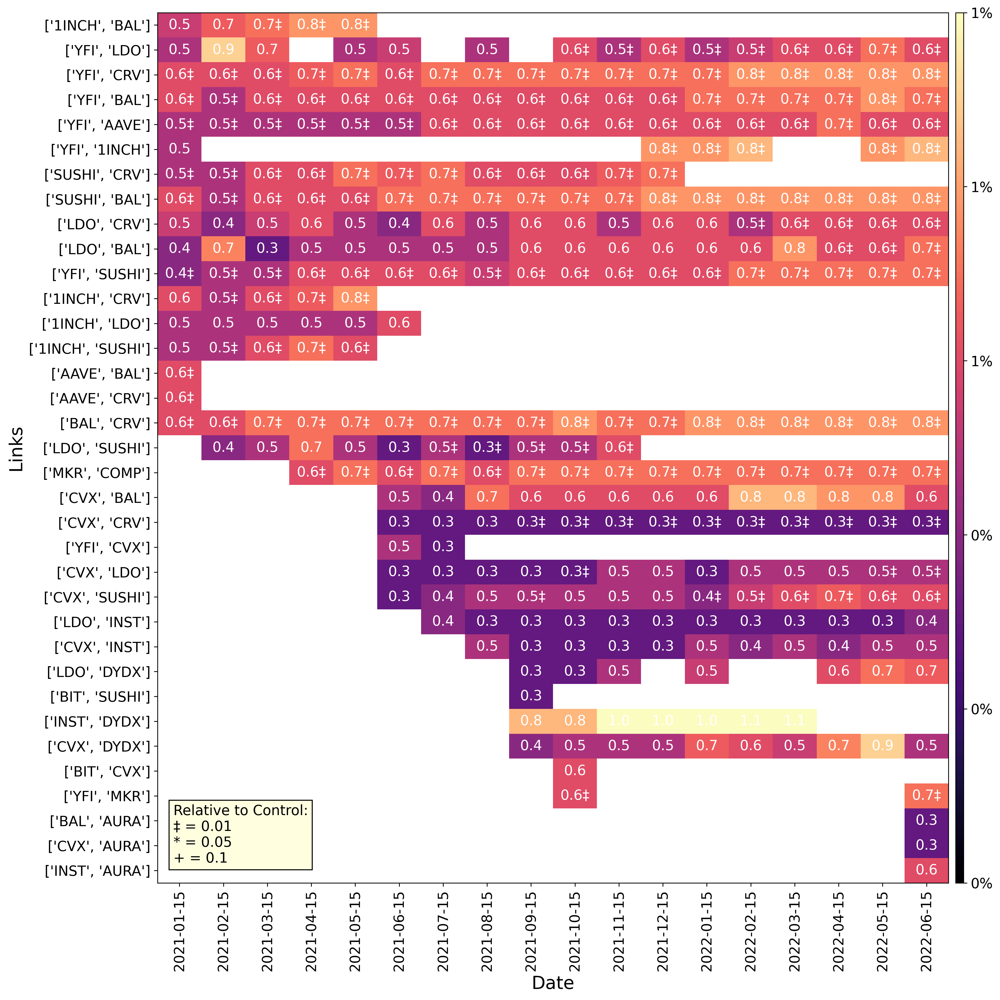

In [28]:
plot_heatmap_chart(metric_dataframes, metric_name='median_number_assets', pct=False, log=True, output_path="../output/links/", save=True, show=True)


### Fig: Distribution of Labels

In [29]:
metric_dataframes.keys()

dict_keys(['sample', 'sample_population', 'pvalues', 'sample_directional', 'sample_population_directional', 'pvalues_directional'])

/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:658: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{int(val)}%' for val in tick_vals])


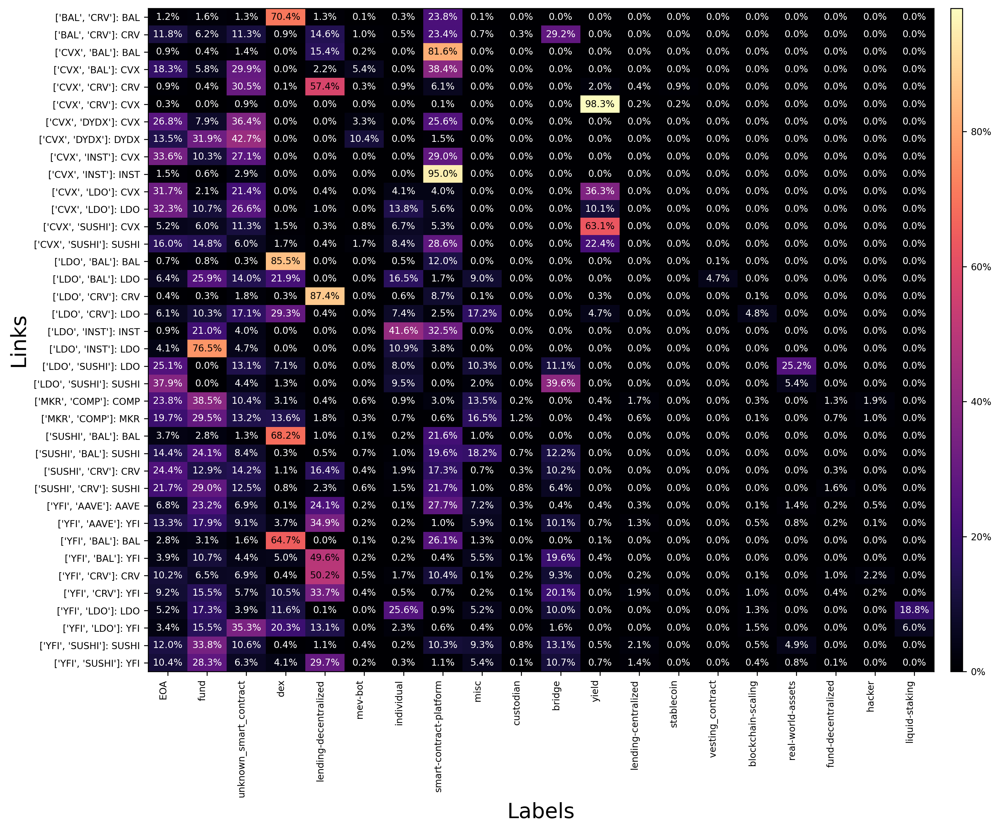

In [30]:
plot_heatmap_labels(metric_dataframes, metric='max_influence_label_distribution', group='sample_directional', colormap='magma', output_path='../output/links', min_occurrences=9)

### Fig: influence_directional

/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


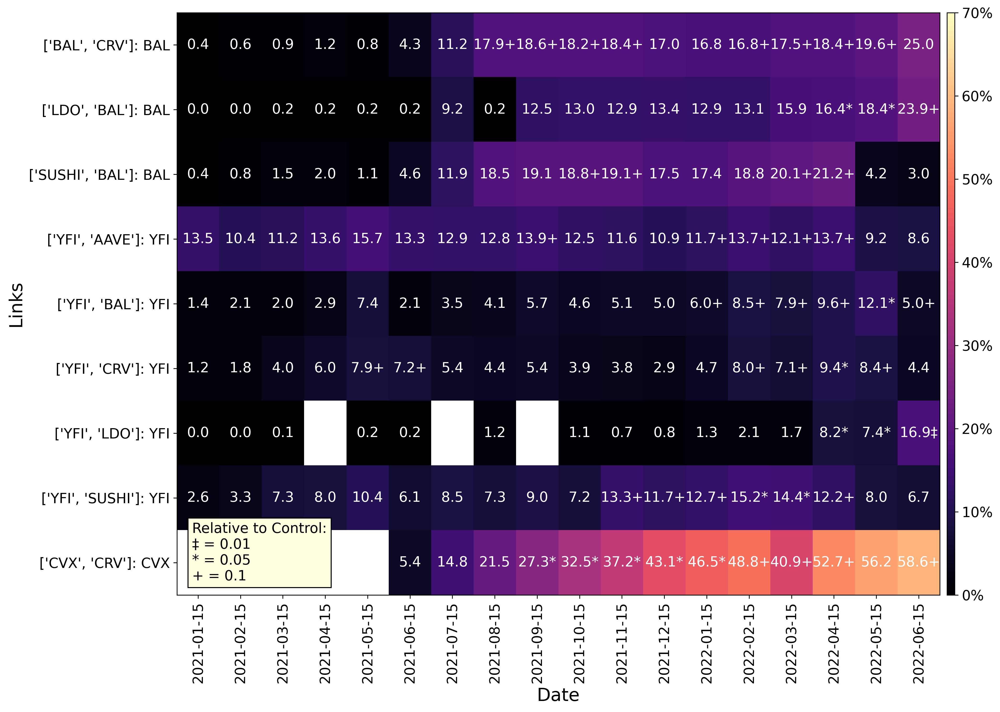

: 

In [ ]:
plot_heatmap_chart_directional(metric_dataframes, metric_name='total_influence_directional', pct=True, log=False, output_path="../output/links/directional_analysis", save=True, show=True, min_occurance=9)

### Sensitivity Analysis 

In [ ]:
# Example usage
file_paths = [
    "../output/links/metrics/links_data_0.005.pkl",
    "../output/links/metrics/links_data_0.05.pkl",
    "../output/links/metrics/links_data_5e-05.pkl",
    "../output/links/metrics/links_data_5e-06.pkl",
    "../output/links/metrics/links_data_5e-07.pkl",
    "../output/links/metrics/links_data_0.0005.pkl"
]

# List of metrics to plot
chosen_metrics = ['size', 
           'median_number_assets', 
        #    'total_influence', 
        #    'gini_total_influence', 
           'internal_influence', 
           'gini_internal_influence', 
        #    'external_influence', 
        #    'gini_external_influence',  
        #    'median_influence', 
           'median_wealth', 
        #    'total_wealth', 
        #    'gini_total_wealth', 
        #    'internal_wealth', 
        #    'gini_internal_wealth', 
        #    'external_wealth', 
        #    'gini_external_wealth'
           ]

sensitivity_analysis(file_paths, chosen_metrics,output_path='../output/links')
